In [2]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

from RIS_gravity_inversion import plotting, synthetic
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.utils as inv_utils


from antarctic_plots import utils, regions, maps, fetch, profile
import numpy as np
import pandas as pd
import geopandas as gpd
from geopandas.tools import sjoin
import xarray as xr
import matplotlib.pyplot as plt
import verde as vd
import pygmt

import pyogrio

# Antarctic Ice Shelf bathymetry contraint density
Here we analyze the major Antarctic ice shelves and calculate the spatial density of direct measurements of bathymetry depths. These measurements are restricted to drill holes with direct observations of water depth, and seismic survey's with accurate bed returns.  

## fetch datasets

In [5]:
spacing = 5e3

imagery = fetch.imagery()

bed = fetch.bedmachine(layer="bed", spacing=spacing)
surface = fetch.bedmachine(layer="surface", spacing=spacing)
thickness = fetch.bedmachine(layer="thickness", spacing=spacing)
icebase = surface - thickness

bedmap_bed = fetch.bedmap2(layer="bed", spacing=spacing)
bedmap_icebase = fetch.bedmap2(layer="icebase", spacing=spacing)

ice_vel = fetch.ice_vel(spacing=spacing)
mass_change = fetch.mass_change(version="ais_dhdt_floating_filt")
basal_melt = fetch.basal_melt()

# fetch MEaSURES iceshelf shapefiles
measures_shelves = fetch.measures_boundaries(version="IceShelf")

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.10/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


using preprocessed 5km grid since spacing is > 5km
returning original grid


# Plotting functions

In [18]:
def plot_ice_shelf_names(fig, ice_shelves, num=10):
    # choose how many ice shelves to plot, sorted by area
    named_shelves = ice_shelves.iloc[0:num]

    # plot names with white shadow
    fig.text(
        x=named_shelves.geometry.centroid.x,
        y=named_shelves.geometry.centroid.y,
        text=[x.replace("_", " ") for x in named_shelves.NAME],
        font="10p,Helvetica,black,-=3p,white",
        justify="BL",
        offset=".6c/.2c+v.6p",
    )
    fig.text(
        x=named_shelves.geometry.centroid.x,
        y=named_shelves.geometry.centroid.y,
        text=[x.replace("_", " ") for x in named_shelves.NAME],
        font="10p,Helvetica,black",
        justify="BL",
        offset=".6c/.2c+v.6p",
    )

## Ice shelf masks
Here we gather regional masks for some of the major Antarctic ice shelves. We will use bedmachine 

In [7]:
# read into a geodataframe
ice_shelves = pyogrio.read_dataframe(measures_shelves)

# calculate area of each ice shelf
ice_shelves["area"] = ice_shelves.area

# sort by area
ice_shelves.sort_values(by="area", ascending=False, inplace=True)

# merge ice shelves which have been split
ronne_filchner = ice_shelves[ice_shelves.NAME.isin(["Ronne", "Filchner"])].dissolve()
ronne_filchner.NAME = "Ronne_Filchner"

RIS = ice_shelves[ice_shelves.NAME.isin(["Ross_West", "Ross_East"])].dissolve()
RIS.NAME = "Ross_Ice_Shelf"

# add joined ice shelves back to dataframe
# ice_shelves = ice_shelves.append([RIS, ronne_filchner])
ice_shelves = pd.concat([ice_shelves, RIS, ronne_filchner])

# remove half ice shelves
ice_shelves.drop(
    labels=ice_shelves[
        ice_shelves.NAME.isin(
            [
                "Ronne",
                "Filchner",
                "Ross_East",
                "Ross_West",
            ]
        )
    ].index,
    inplace=True,
)

# re-calculate area of each ice shelf
ice_shelves["area"] = ice_shelves.area

# sort by area again
ice_shelves.sort_values(by="area", ascending=False, inplace=True)

ice_shelves

,NAME,Regions,TYPE,geometry,area
0,Ross_Ice_Shelf,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",4.804284e+11
0,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.980, -1006335.92...",4.270417e+11
114,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",6.079728e+10
7,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",4.744351e+10
36,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",4.291314e+10
...,...,...,...,...,...
132,Arneb,East,FL,"POLYGON ((333867.825 -1897953.452, 333673.461 ...",6.408391e+06
129,Falkner,East,FL,"POLYGON ((425350.532 -1726631.609, 423726.753 ...",5.688547e+06
164,Hamilton_Piedmont,Islands,FL,"POLYGON ((-1589132.027 -582392.525, -1589188.1...",5.601416e+06
180,Rydberg_Peninsula_2,Peninsula,FL,"POLYGON ((-1795805.815 347774.271, -1795801.94...",3.109665e+06


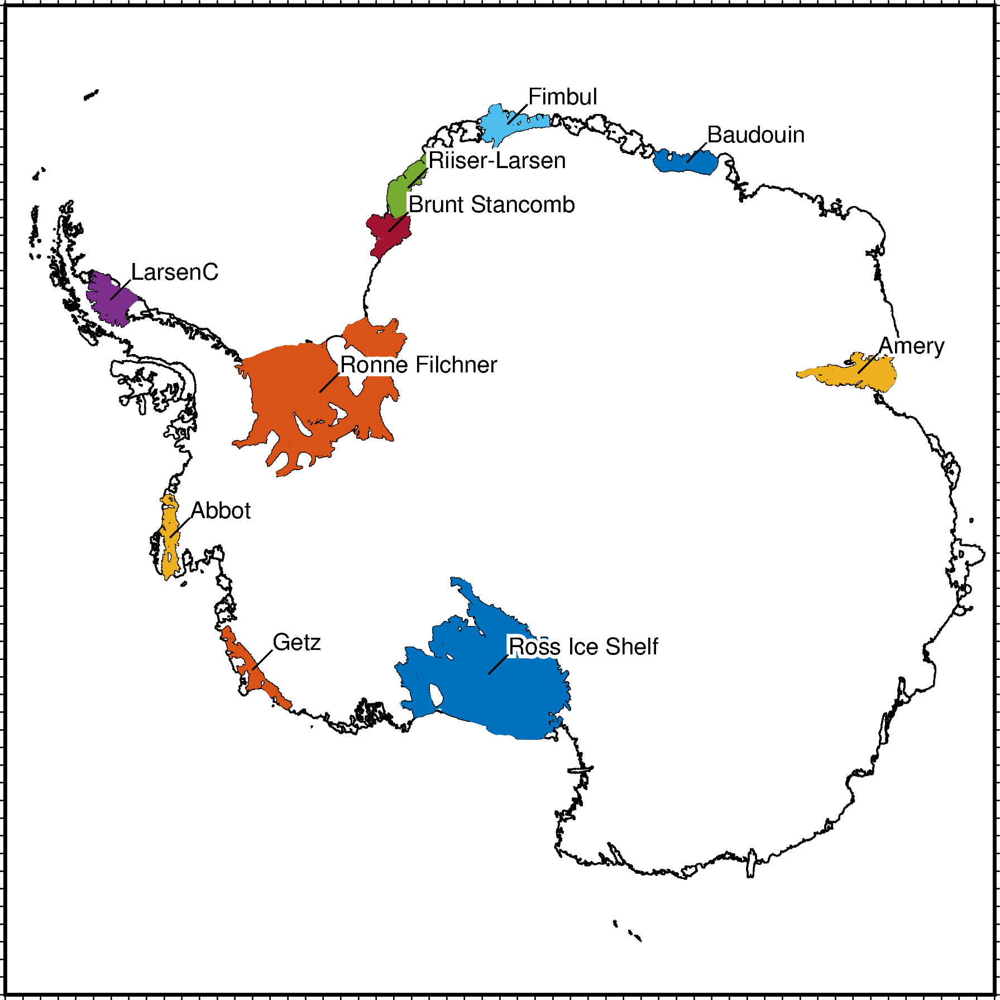

In [5]:
# choose how many ice shelves to plot
df = ice_shelves.iloc[0:10]

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    region=regions.antarctica,
    coast=True,
)

# plot ice shelves
fig.plot(
    df,
    close=True,
    fill="auto",
)

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)


fig.show()

returning grid with new region and/or registration, same spacing


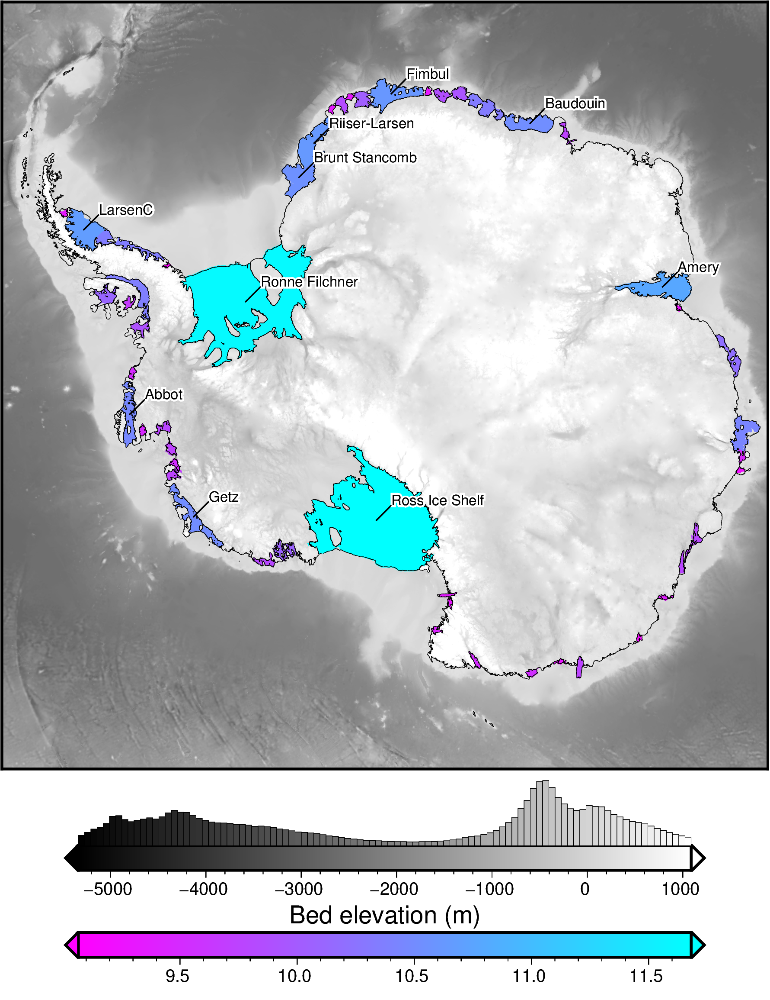

In [8]:
df = ice_shelves.iloc[0:50].copy()

df["log_area"] = np.log10(df.area)

# plot imagery and coastline
fig = maps.plot_grd(
    # imagery,
    # image=True,
    bed,
    # cmap="etopo1",
    # cmap="geo",
    # cmap="earth",
    # cmap="globe",
    # cmap="relief",
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=40,
    cbar_label="Bed elevation (m)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
)
# plot basemap with coastline and grounding lines
# fig = maps.basemap(
#     fig_height=15,
#     region=regions.antarctica,
#     # coast=True,
# )

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="cool",
    reverse=True,
    series=utils.get_min_max(df.log_area),
    background="o",
    # log=True,
)

# plot ice shelves
fig.plot(
    df,
    color="+z",
    aspatial="Z=log_area",
    close=True,
    cmap=True,
)

# add colorbar with custom annotation values
# get even log-spaced values of colormap
log_values = np.linspace(df.log_area.min(), df.log_area.max(), 5)
# convert to area value rounded to nearest 1000
area_values = [int(round((10**x) / 1e6, -3)) for x in log_values]
# convert back to log-spaced values
log_values = [np.log10(x * 1e6) for x in area_values]
annots = [f"{loc} a {label}" for loc, label in zip(log_values, area_values)]
annots = "\n".join(annots)
with open("../plotting/tmp.txt", "w") as f:
    f.write(annots)

maps.add_colorbar(
    fig=fig,
    # cbar_label = "Ice shelf area (km@+2@+)",
    frame=[f"xc../plotting/tmp.txt+lIce shelf area (km@+2@+)"],
    cbar_yoffset=3.2,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)


fig.show()

# Ice mass change

grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 2800000 to 2803359.94233


returning grid with new region and/or registration, same spacing


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 2800000 to 2800664.71932


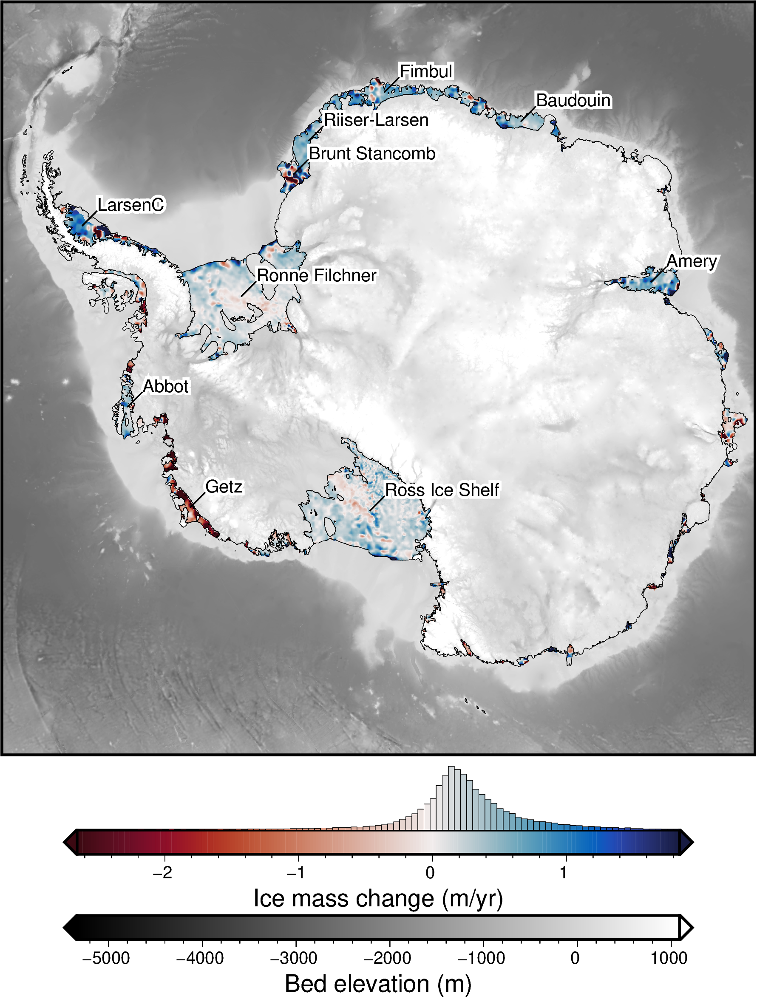

In [20]:
df = ice_shelves.iloc[0:50].copy()

# # plot imagery and coastline
# fig = maps.plot_grd(
#     imagery,
#     image=True,
#     fig_height=15,
#     region=regions.antarctica,
#     transparency=50,
# )
# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    mass_change,
    fig=fig,
    origin_shift="no_shift",
    reverse_cpt=True,
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ice mass change (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)


fig.show()

# Basal melt

returning grid with new region and/or registration, same spacing


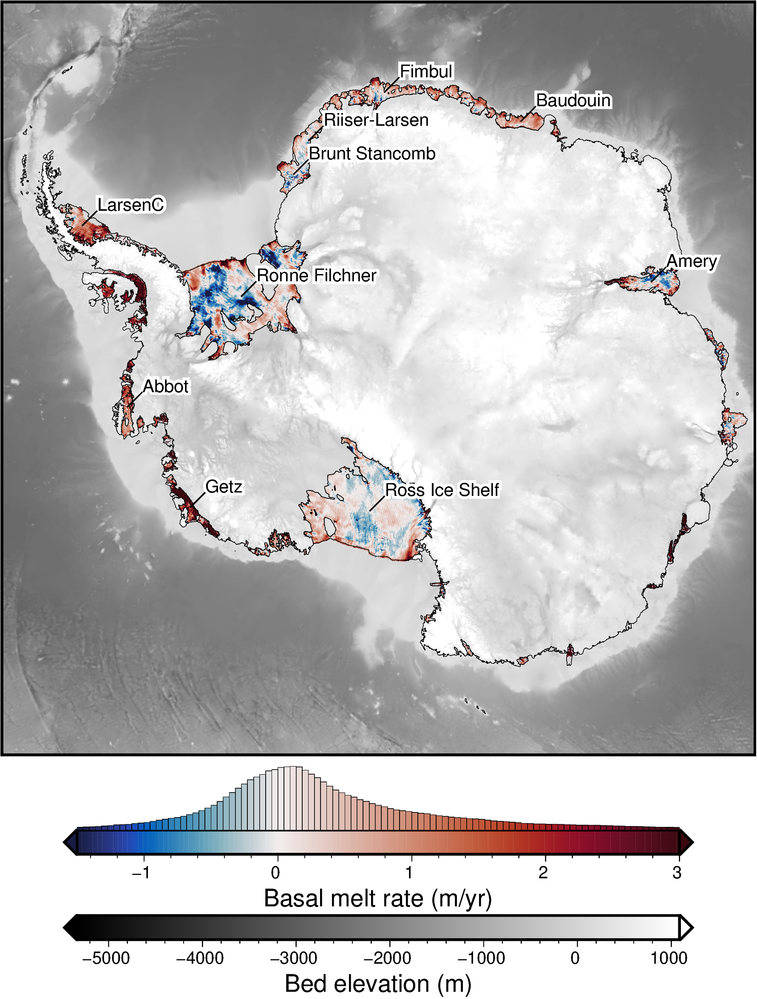

In [8]:
df = ice_shelves.iloc[0:50].copy()

# # plot imagery and coastline
# fig = maps.plot_grd(
#     imagery,
#     image=True,
#     fig_height=15,
#     region=regions.antarctica,
#     transparency=50,
# )
# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    basal_melt,
    fig=fig,
    origin_shift="no_shift",
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Basal melt rate (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[-1.5, 3],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.show()

# Ice Shelf Ocean Draft (icebase to bed)

In [13]:
ocean_draft = icebase - bed
# ocean_draft = bedmap_icebase - bedmap_bed

# ensure no negative thickness values
ocean_draft = xr.where(ocean_draft < 0, np.nan, ocean_draft)

# mask the ocean draft to ice shelves.
ocean_draft_masked = utils.mask_from_shp(
    shapefile=ice_shelves,
    xr_grid=ocean_draft,
    invert=False,
    masked=True,
)

returning grid with new region and/or registration, same spacing


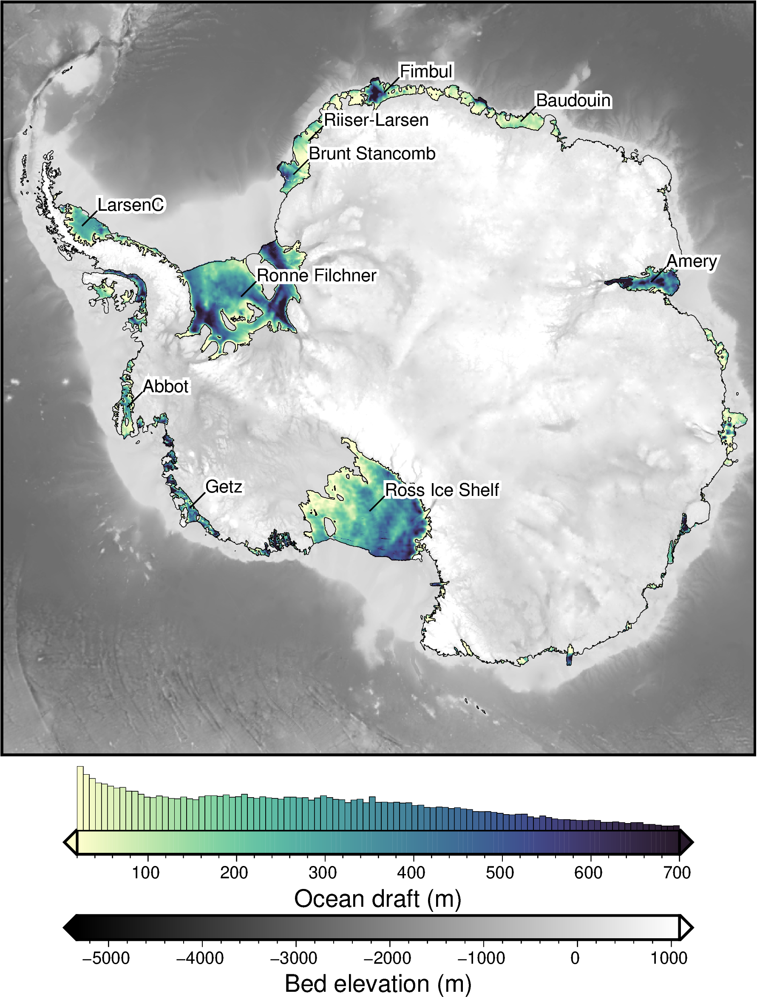

In [16]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:50].copy()

# # plot imagery and coastline
# fig = maps.plot_grd(
#     imagery,
#     image=True,
#     fig_height=15,
#     region=regions.antarctica,
#     transparency=50,
# )
# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[20, 700],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)


fig.show()

returning grid with new region and/or registration, same spacing


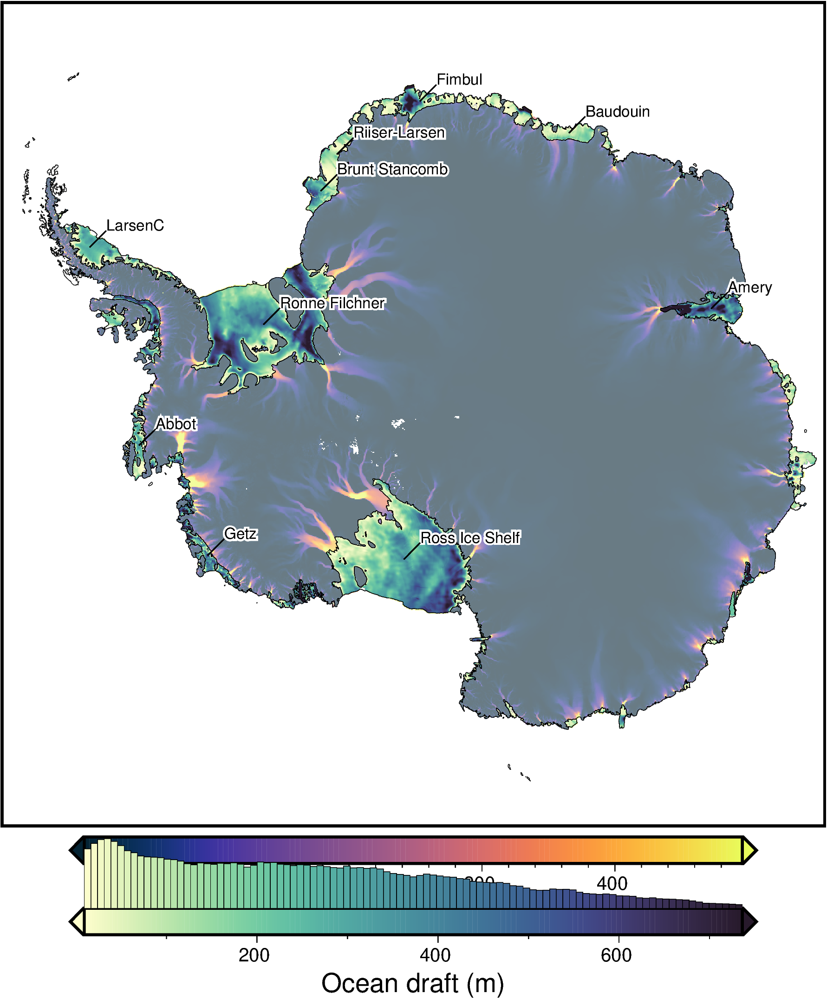

In [137]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:50].copy()

# plot ice velocity and coastline
lims = np.nanquantile(ice_vel, [0.04, 0.96])
fig = maps.plot_grd(
    ice_vel,
    cpt_lims=lims,
    cmap="thermal",
    fig_height=15,
    region=regions.antarctica,
    transparency=40,
    cbar_yoffset=3.2,
)

fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)


fig.show()

# Basal melt and ocean draft

returning grid with new region and/or registration, same spacing
returning grid with new region and/or registration, same spacing


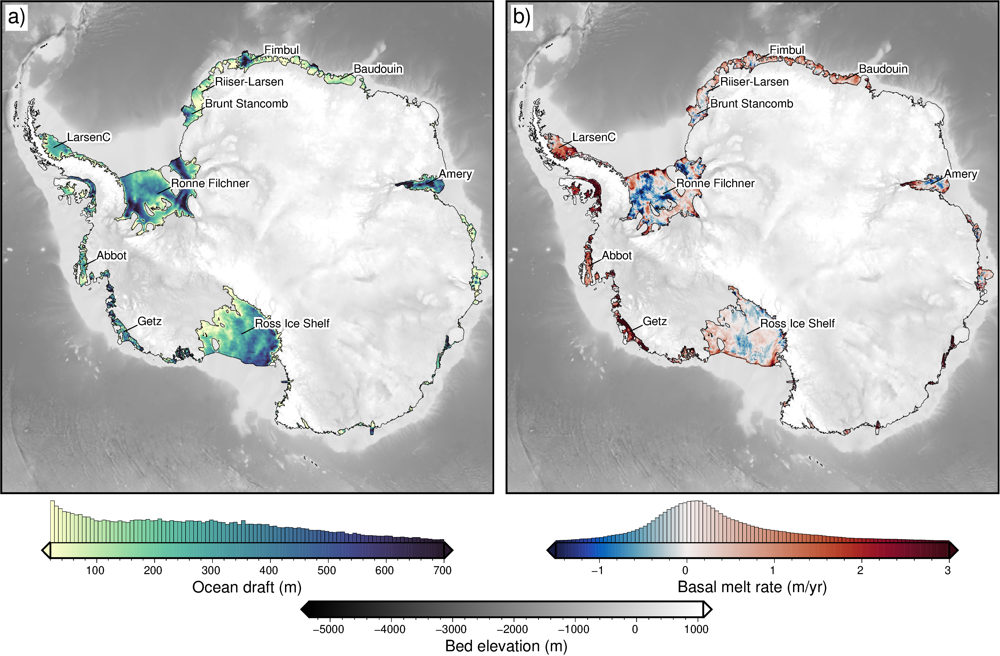

In [21]:
df = ice_shelves.iloc[0:50].copy()

# plot bed and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=50,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    cbar_xoffset=7.5,
    robust=True,
    colorbar=False,
)

# plot ocean draft
fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    cpt_lims=[20, 700],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.text(
    position="TL",
    justify="TL",
    text="a)",
    fill="white",
    font="18p,Helvetica,black",
    offset="j.2c/.2c",
    no_clip=True,
)

# plot bed and coastline
fig = maps.plot_grd(
    bed,
    fig=fig,
    origin_shift="xshift",
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=50,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.3,
    cbar_xoffset=-7.5,
    robust=True,
)

# plot basal melt
fig = maps.plot_grd(
    basal_melt,
    fig=fig,
    origin_shift="no_shift",
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Basal melt rate (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[-1.5, 3],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.text(
    position="TL",
    justify="TL",
    text="b)",
    fill="white",
    font="18p,Helvetica,black",
    offset="j.2c/.2c",
    no_clip=True,
)

fig.show()

## Get average ocean draft measurement for each shelf

In [98]:
# convert dataarray to dataframe, dropping rows with nans
df = vd.grid_to_table(ocean_draft).dropna(how="any")
df = df.rename(columns={"scalars": "draft"})
df = df.reset_index()
# ocean_draft_gpd.reset_index()
# turn draft data into geopandas geodataframe with points
ocean_draft_gpd = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(x=df.x, y=df.y), crs="3031"
)

# merge ocean draft point data and ice shelf polygons
merged = gpd.sjoin(ocean_draft_gpd, ice_shelves, how="left")

# get stats for each ice shelf
stats_pt = merged.groupby("NAME").agg(
    draft_mean=("draft", "mean"),
    draft_std=("draft", "std"),
    draft_max=("draft", "max"),
    draft_min=("draft", "min"),
)

# merge stats back into ice shelf gdf
ice_shelves = pd.merge(
    ice_shelves, stats_pt, left_on="NAME", right_index=True, how="outer"
)

ice_shelves.sort_values(by="draft_max", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
0,Ross_Ice_Shelf,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",4.804284e+11,281.969330,168.845891,3593.341797,0.203430
118,Borchgrevink,East,FL,"POLYGON ((673415.109 2122771.487, 672998.689 2...",2.161561e+10,214.870316,464.968396,2765.564209,0.077026
35,Brunt_Stancomb,East,FL,"POLYGON ((-648673.952 1612385.898, -648144.200...",3.613710e+10,269.845673,274.074134,2488.145996,1.348755
120,Fimbul,East,FL,"POLYGON ((145423.961 2176737.792, 145088.314 2...",4.094775e+10,328.203522,342.062998,2148.403809,3.203125
36,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",4.291314e+10,102.874016,138.819300,2113.441650,0.042664


In [99]:
ice_shelves.sort_values(by="draft_min", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
21,Hovde,East,FL,"POLYGON ((2222299.946 514574.965, 2221330.223 ...",1.667814e+07,660.843994,NaN,660.843994,660.843994
166,Hummer_Point,Islands,FL,"POLYGON ((-1597171.359 -586925.122, -1597492.7...",2.897850e+07,481.955811,NaN,481.955811,481.955811
20,Flatnes,East,FL,"POLYGON ((2203925.160 525825.094, 2204199.853 ...",7.397817e+07,755.033997,337.405494,1120.917847,456.164398
143,Andreyev,East,FL,"POLYGON ((956994.264 -2103380.108, 956940.375 ...",8.738577e+07,481.459869,65.290555,538.302185,410.148499
22,Dalk,East,FL,"POLYGON ((2199011.876 527659.283, 2197112.442 ...",3.543636e+07,562.595093,277.413303,758.755920,366.434265


In [100]:
ice_shelves.sort_values(by="draft_mean", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
20,Flatnes,East,FL,"POLYGON ((2203925.160 525825.094, 2204199.853 ...",7.397817e+07,755.033997,337.405494,1120.917847,456.164398
21,Hovde,East,FL,"POLYGON ((2222299.946 514574.965, 2221330.223 ...",1.667814e+07,660.843994,NaN,660.843994,660.843994
22,Dalk,East,FL,"POLYGON ((2199011.876 527659.283, 2197112.442 ...",3.543636e+07,562.595093,277.413303,758.755920,366.434265
97,Totten,East,FL,"POLYGON ((2246041.394 -1157675.447, 2239414.25...",6.187043e+09,545.465820,395.615404,1635.535889,6.579529
102,Sorsdal,East,FL,"POLYGON ((2284549.327 480449.732, 2284924.838 ...",1.332768e+08,495.710693,362.970652,1182.959351,113.993973


In [101]:
ice_shelves.sort_values(by="draft_std", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
118,Borchgrevink,East,FL,"POLYGON ((673415.109 2122771.487, 672998.689 2...",2.161561e+10,214.870316,464.968396,2765.564209,0.077026
97,Totten,East,FL,"POLYGON ((2246041.394 -1157675.447, 2239414.25...",6.187043e+09,545.465820,395.615404,1635.535889,6.579529
64,Sulzberger,West,FL,"POLYGON ((-661704.253 -1219812.221, -661564.09...",1.196952e+10,456.660553,363.640932,1593.856934,2.267319
102,Sorsdal,East,FL,"POLYGON ((2284549.327 480449.732, 2284924.838 ...",1.332768e+08,495.710693,362.970652,1182.959351,113.993973
120,Fimbul,East,FL,"POLYGON ((145423.961 2176737.792, 145088.314 2...",4.094775e+10,328.203522,342.062998,2148.403809,3.203125


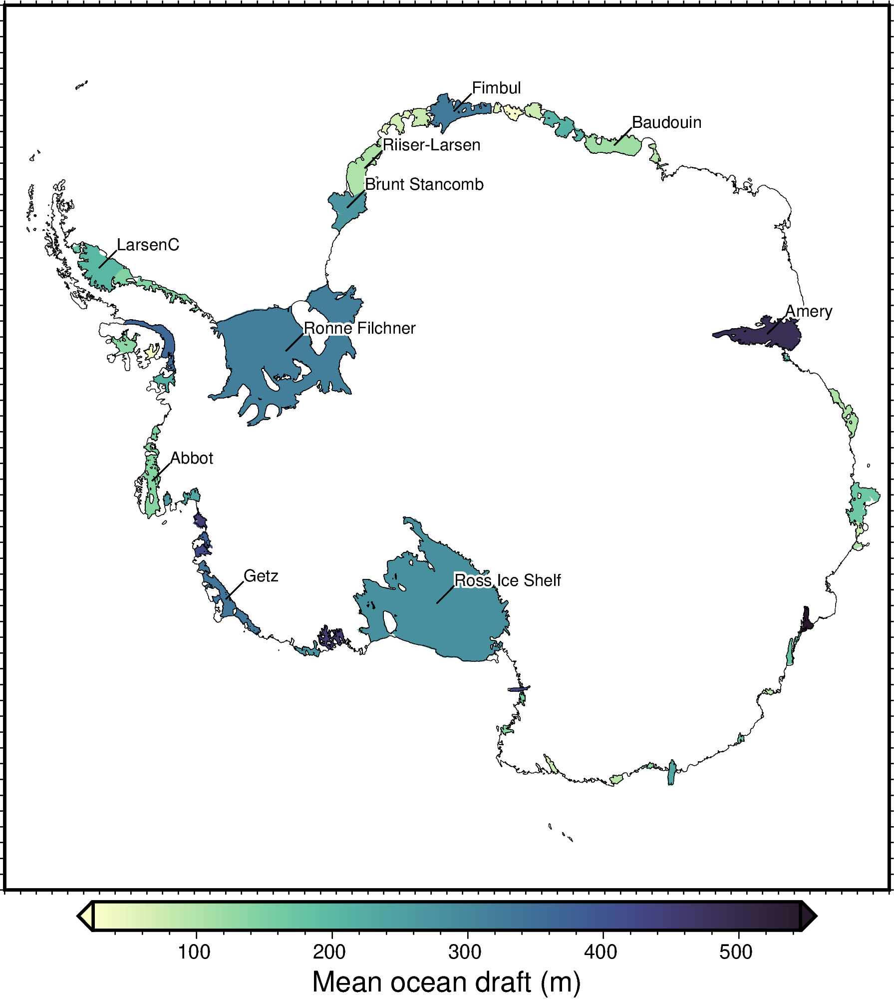

In [104]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:50].copy()

# plot imagery and coastline
# fig = maps.plot_grd(
#     bed,
#     cmap="gray",
#     fig_height=15,
#     # shading=True,
#     region=regions.antarctica,
#     transparency=40,
#     cbar_label="Bed elevation (m)",
#     hist=True,
#     cbar_yoffset=1.5,
#     robust=True,
# )

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    fig_height=15,
    region=regions.antarctica,
    # coast=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="deep",
    series=utils.get_min_max(df.draft_mean),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    color="+z",
    aspatial="Z=draft_mean",
    close=True,
    cmap=True,
)

maps.add_colorbar(
    fig=fig,
    cbar_label="Mean ocean draft (m)",
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)


fig.show()